### Eindpresentatie, Serhat_Kokcu-500858425-Tuncay-Kilic-500827104,Umut-Demirtas-500837354

In [44]:
import pandas as pd
import requests
import json
import datetime
import numpy as np
from shapely.geometry import Point, Polygon
from matplotlib import pyplot
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import branca
import branca.colormap as cm
import streamlit as st
import streamlit_folium
from streamlit_folium import folium_static

ModuleNotFoundError: No module named 'geopandas'

In [45]:
dataframe = pd.read_csv("earthquakes.csv")


In [46]:
dataframe['place'] = dataframe['place'].astype(str)

In [47]:
dataframe['placenew'] = dataframe['place'].str.split(',').str[1]
dataframe.head()

,Unnamed: 0,Date,Time,latitude,longitude,depth,mag,magType,nst,net,id,updated,place,type,placenew
0,0,2014-03-17,05:11:34,-20.0030,-70.8741,17.0,6.2,mww,NaN,us,usc000ndw9,2014-03-17T14:57:11.000Z,"80km WNW of Iquique, Chile",earthquake,Chile
1,1,2014-03-16,21:16:30,-19.9246,-70.6278,20.0,6.7,mww,NaN,us,usc000ndnj,2014-03-17T18:43:29.249Z,"60km WNW of Iquique, Chile",earthquake,Chile
2,2,2014-03-15,23:51:30,-5.5660,-80.8790,9.8,6.3,mwp,NaN,us,usc000nd0c,2014-03-18T17:52:18.000Z,"6km W of Sechura, Peru",earthquake,Peru
3,3,2014-03-15,08:59:21,-14.0935,-76.2968,20.0,6.1,mww,NaN,us,usc000ncbl,2014-03-16T05:34:44.387Z,"25km S of Paracas, Peru",earthquake,Peru
4,4,2014-03-13,17:06:50,33.6793,131.8197,79.0,6.3,mwb,NaN,us,usc000nabv,2014-03-17T23:24:32.491Z,"15km NNE of Kunisaki-shi, Japan",earthquake,Japan


In [48]:
#Vervang NaN met unkown zodat het duidelijk is hoe groot het aandel aan verloren data is.
dataframe.placenew = dataframe.placenew.fillna('unknown')

top10 = dataframe[dataframe["placenew"].str.contains("Papua New Guinea|Indonesia|Chile|Aleutian Islands|Philippines|Japan region|Mexico|Russia|China")]




In [49]:
fig = px.box(top10, x="placenew", y="mag",
                 labels={
                     "mag": "Magnitude",
                     "placenew": "Landen",
                 },
                title="Magnitude t.o.v. land")
fig.show()

In [50]:
fig = px.box(top10, x="placenew", y="depth",
                 labels={
                     "depth": "diepte",
                     "placenew": "Land",
                 },
                title="Diepte van aardbeving t.o.v. land")
fig.show()

In [51]:
fig = px.box(top10, x="placenew", y="Date",
                 labels={
                     "Date": "Datum",
                     "placenew": "Land",
                 },
                title="Datum per aardsbeving verdeeld in landen")
fig.show()

In [52]:
top10x = top10.dropna()

In [53]:
top10x['year'] = pd.DatetimeIndex(top10x['Date']).year
top10x.head()


C:\Users\Serhat\AppData\Local\Temp\ipykernel_14712\2107042900.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Unnamed: 0,Date,Time,latitude,longitude,depth,mag,magType,nst,net,id,updated,place,type,placenew,year
89,89,2013-07-16,09:35:54,-6.3085,154.7822,44.25,6.0,Mwb,87.0,us,usb000if30,2013-09-23T19:52:42.000Z,"77km W of Panguna, Papua New Guinea",earthquake,Papua New Guinea,2013
91,91,2013-07-07,20:30:07,-6.0155,149.7215,62.03,6.6,Mww,113.0,us,usb000i8ey,2013-09-23T19:52:23.000Z,"29km NE of Kandrian, Papua New Guinea",earthquake,Papua New Guinea,2013
92,92,2013-07-07,18:35:30,-3.9234,153.9204,386.25,7.3,Mww,108.0,us,usb000i89z,2013-11-01T18:56:58.000Z,"115km ENE of Taron, Papua New Guinea",earthquake,Papua New Guinea,2013
93,93,2013-07-06,05:05:06,-3.2490,100.5668,19.70,6.0,Mwb,111.0,us,usb000i7na,2013-11-01T18:56:53.000Z,"157km SW of Sungaipenuh, Indonesia",earthquake,Indonesia,2013
94,94,2013-07-04,17:16:00,-7.0390,155.6438,72.00,6.1,Mwb,121.0,us,usb000i6rh,2013-09-23T19:52:19.000Z,"81km SSE of Panguna, Papua New Guinea",earthquake,Papua New Guinea,2013


In [54]:
fig = px.scatter(top10x, x="depth", y="mag", animation_frame="year", #animation_group="placenew",
           size="mag", color="placenew", hover_name="placenew",
           log_x=False, size_max=55, range_x=[0,100], range_y=[0,20])

fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.show()

In [55]:
fig = px.histogram(dataframe, x="mag", color="placenew").update_xaxes(categoryorder='total descending',
                title="Aandel van landen in aardbevingen beoordeeld op magnitude")
fig.show()

In [56]:
figT = px.histogram(dataframe, x="depth", color="placenew", marginal="rug", # can be `box`, `violin`
                         hover_data=dataframe)
figT.show()

In [57]:
fig = px.scatter(dataframe, x="mag", y="depth",
                 labels={
                     "depth": "Diepte",
                     "mag": "Magnitude"},
                title="Verband tussen magnitude en diepte van een aardbeving. van de aardbevingen")
fig.show()

In [58]:
fig = px.scatter(top10, x="mag", y="longitude",
                 labels={
                     "depth": "Diepte",
                     "mag": "Magnitude"},
                title="Verband tussen de magnitude en de locatie (longitude) van de aardbevingen")
fig.show()

In [59]:
top10.head()

,Unnamed: 0,Date,Time,latitude,longitude,depth,mag,magType,nst,net,id,updated,place,type,placenew
0,0,2014-03-17,05:11:34,-20.0030,-70.8741,17.0,6.2,mww,NaN,us,usc000ndw9,2014-03-17T14:57:11.000Z,"80km WNW of Iquique, Chile",earthquake,Chile
1,1,2014-03-16,21:16:30,-19.9246,-70.6278,20.0,6.7,mww,NaN,us,usc000ndnj,2014-03-17T18:43:29.249Z,"60km WNW of Iquique, Chile",earthquake,Chile
5,5,2014-03-11,22:03:11,-3.1128,148.4774,10.0,6.1,mww,NaN,us,usc000n8ez,2014-03-12T21:57:02.000Z,"180km SE of Lorengau, Papua New Guinea",earthquake,Papua New Guinea
13,13,2014-02-12,09:19:49,35.9060,82.5865,10.0,6.9,mww,NaN,us,usc000mnvj,2014-03-16T11:23:34.032Z,"272km ESE of Hotan, China",earthquake,China
14,14,2014-02-09,14:56:39,-5.9651,154.4350,41.8,6.0,mww,NaN,us,usc000mlk4,2014-03-04T23:16:00.120Z,"122km WNW of Panguna, Papua New Guinea",earthquake,Papua New Guinea


In [60]:
newdf = dataframe["placenew"].value_counts()
newdf.head(15)

unknown              4392
 Indonesia            632
 Papua New Guinea     545
 Japan                494
 Chile                307
 Aleutian Islands     234
 Philippines          228
 Japan region         210
 Mexico               200
 Russia               159
 China                117
 New Zealand           99
 Argentina             86
 Afghanistan           83
 Alaska                55
Name: placenew, dtype: int64

In [61]:
stad = st.text_input('stad', 'casablanca')

In [62]:
api_key = "885ad48647fcd8f54a243936ff054f13"
## bron API dataset : https://openweathermap.org
city_name = stad 
                    #bron: https://www.worldatlas.com/articles/cities-most-likely-to-be-hit-by-an-earthquake.html
        

#Let's get the city's coordinates (lat and lon)
url = f'https://api.openweathermap.org/data/2.5/weather?q={city_name}&appid={api_key}'
print(url)

#Let's parse the Json
req = requests.get(url)
data = req.json()

#Let's get the name, the longitude and latitude
name = data['name']
lon = data['coord']['lon']
lat = data['coord']['lat']
temp = data['main']['temp']
print(name, lon, lat, temp)

https://api.openweathermap.org/data/2.5/weather?q=casablanca&appid=885ad48647fcd8f54a243936ff054f13
Casablanca -7.6192 33.5928 295.84


In [63]:
data

{'coord': {'lon': -7.6192, 'lat': 33.5928},
 'weather': [{'id': 802,
   'main': 'Clouds',
   'description': 'scattered clouds',
   'icon': '03d'}],
 'base': 'stations',
 'main': {'temp': 295.84,
  'feels_like': 295.89,
  'temp_min': 295,
  'temp_max': 298.27,
  'pressure': 1023,
  'humidity': 66},
 'visibility': 10000,
 'wind': {'speed': 3.09, 'deg': 20},
 'clouds': {'all': 40},
 'dt': 1667485573,
 'sys': {'type': 2,
  'id': 47681,
  'country': 'MA',
  'sunrise': 1667458257,
  'sunset': 1667497022},
 'timezone': 3600,
 'id': 2553604,
 'name': 'Casablanca',
 'cod': 200}

In [64]:
map = folium.Map()

clustermod = MarkerCluster().add_to(map)

for row in dataframe.iterrows():
    row_values = row[1]
    popup1 = row_values["place"]
    prefer_canvas=True
    location = [row_values['latitude'], row_values['longitude']]
    marker = folium.Marker(location = location, popup = "Earthquake occurence")
    marker.add_to(clustermod)


    #prefer_canvas=True, per locatie zien duurt heel lang om te laden.
    #
    
    
colormap = cm.LinearColormap(colors=['green', 'yellow','darkorange'], index=[0, 50, 100],vmin=0,vmax=220)
colormap.caption = 'Hoeveelheid aardbevingen per sector'
colormap
colormap.add_to(map)

map


In [65]:
data = newdf = dataframe["placenew"].value_counts()

df1 = pd.DataFrame(data)

In [66]:
df1.head()

,placenew
unknown,4392
Indonesia,632
Papua New Guinea,545
Japan,494
Chile,307


In [67]:
df1.columns

Index(['placenew'], dtype='object')

In [68]:
df1.reset_index()

,index,placenew
0,unknown,4392
1,Indonesia,632
2,Papua New Guinea,545
3,Japan,494
4,Chile,307
...,...,...
71,Christmas Island,1
72,Barbados,1
73,Congo-Rwanda-Uganda,1
74,Kazakhstan,1


In [69]:
#relevant = df1["placenew"] > 20

relevant = df1[df1['placenew'] >= 20]


In [70]:
relevant.head(10)



,placenew
unknown,4392
Indonesia,632
Papua New Guinea,545
Japan,494
Chile,307
Aleutian Islands,234
Philippines,228
Japan region,210
Mexico,200
Russia,159


<AxesSubplot:>

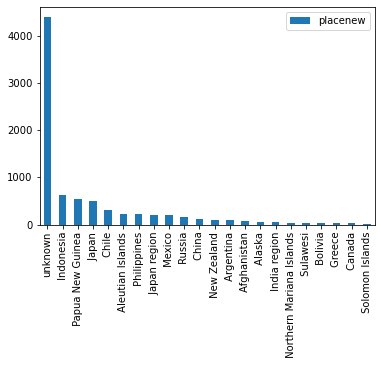

In [71]:
relevant.plot.bar()

In [72]:
dataframe['Date'] = pd.to_datetime(dataframe['Date'])


In [73]:
jaar=dataframe.groupby(dataframe['Date'].dt.year)['mag'].agg(['sum', 'mean', 'max']).reset_index()
jaar

,Date,sum,mean,max
0,1900,148.5,7.071429,7.7
1,1901,188.9,6.996296,7.9
2,1902,208.4,6.946667,7.8
3,1903,127.0,7.055556,8.1
4,1904,141.1,7.055000,7.6
...,...,...,...,...
110,2010,1118.0,6.425287,8.8
111,2011,1315.0,6.352657,9.0
112,2012,851.1,6.399248,8.6
113,2013,917.1,6.413287,8.3


[Text(0.5, 1.0, 'Lineaire regressie, aantal aardbevingen per jaar'),
 Text(0.5, 0, 'jaar'),
 Text(0, 0.5, 'Aantal aardbevingen')]

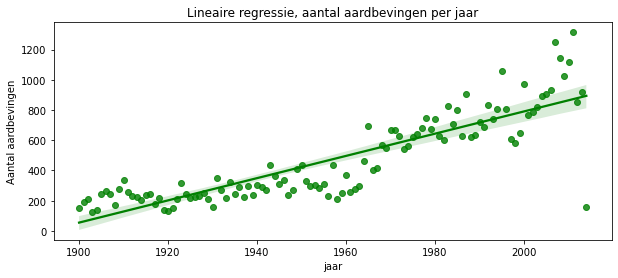

In [74]:
fig_reg = plt.figure(figsize=(10, 4))
ax=sns.regplot(data=jaar, x='Date', y='sum',
            fit_reg=True,scatter=True,
           color= 'green')

ax.set(title="Lineaire regressie, aantal aardbevingen per jaar",
      xlabel= "jaar", ylabel='Aantal aardbevingen')

#st.pyplot(fig_reg)



### wat zien we hier?

In [75]:
#er is een positieve correlatie met stijging in jaar en aantal aardbevingen. heeft dit te maken met stijging in temperatuur?

In [76]:
fig_ = go.Figure()

fig_.add_trace(
    go.Scatter(x=jaar['Date'],
               y=jaar['sum'],
               name="sum",
               mode='markers',
               showlegend = True,
               marker_symbol='circle',
               marker_color= 'red'))

fig_.add_trace(
    go.Scatter(x=jaar['Date'],
               y=jaar['mean'],
               name="mean",
               mode='markers',
               visible=False,
               showlegend = True,
               marker_color= 'black',
               marker_symbol='triangle-left-open-dot',))

fig_.add_trace(
    go.Scatter(x=jaar['Date'],
               y=jaar['max'],
               name="max",
               mode='markers',
               showlegend = True,
               visible=False,
               marker_color= 'purple',
               marker_symbol='x-open-dot',))


fig_.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="sum",
                     method="update",
                     args=[{"visible": [True, False, False,]},
                           {"title": "sum"}]),
                dict(label="mean",
                     method="update",
                     args=[{"visible": [False, True, False,]},
                           {"title": "mean"}]),
                dict(label="max",
                     method="update",
                     args=[{"visible": [False, False, True,]},
                           {"title": "max"}]),
                    ]),
        )
    ])

fig_.update_xaxes(range=[1900, 2020])
# Add annotation
fig_.update_layout(
    annotations=[
        dict(text=":", showarrow=False,
        x=0, y=1.085, yref="paper", align="left")
    ]
)

fig_.show()
st.plotly_chart(fig_)

DeltaGenerator(_root_container=0, _provided_cursor=None, _parent=None, _block_type=None, _form_data=None)

In [77]:
import plotly.express as px

df = px.data.tips()
fig = px.scatter(jaar, x="Date", y="sum", trendline="ols")
fig.show()

results = px.get_trendline_results(fig)
RSQ = px.get_trendline_results(fig).px_fit_results.iloc[0].rsquared
print(results)

resultsF = results.iloc[0]["px_fit_results"].summary()


                                      px_fit_results
0  <statsmodels.regression.linear_model.Regressio...


In [78]:
print("The R-Squared value is ",RSQ)

The R-Squared value is  0.7401856768117842


In [79]:
print(resultsF)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.740
Model:                            OLS   Adj. R-squared:                  0.738
Method:                 Least Squares   F-statistic:                     321.9
Date:                Thu, 03 Nov 2022   Prob (F-statistic):           7.36e-35
Time:                        15:36:19   Log-Likelihood:                -735.31
No. Observations:                 115   AIC:                             1475.
Df Residuals:                     113   BIC:                             1480.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.393e+04    802.922    -17.349      0.0

In [ ]:
print("Vul hieronder het jaar in, en ons model maakt een verwachte 'forecast' met aantal aardbevingen")
x = input()

formula = -1.393e+04 + x * 7.3603

        

Vul hieronder het jaar in, en ons model maakt een verwachte 'forecast' met aantal aardbevingen


In [ ]:
print(x)